# Multimodal Embeddings

* Using text or image as input/output for similarities.
* Using vertexai.vision_models

In [59]:
import scann
import base64
import requests
import vertexai
from io import BytesIO
import numpy as np
import pandas as pd
from PIL import Image as Img
from google.cloud import storage, aiplatform
import vertexai.generative_models as generative_models
from vertexai.vision_models import MultiModalEmbeddingModel, Image
from vertexai.generative_models import GenerativeModel, Part, FinishReason

In [ ]:
storage_client = storage.Client()

## Dataset

In [26]:
mm = MultiModalEmbeddingModel.from_pretrained("multimodalembedding")
df = pd.read_csv("gs://vtxdemos-vsearch-datasets/abnb_combined/combined_data.csv")

### Creating Embeddings

In [22]:
id_list = []
embeddings = []

for index, row in df.iterrows():
    for im in ["Img_interior_url_", "Img_exterior_url_"]:
        for i in range(5):
            _img = row[f"{im}{i}"].replace("https://storage.googleapis.com/", "gs://")
            print(f"Processing {_img}")
            e = mm.get_embeddings(
                image=Image(
                    gcs_uri=_img
                ),
            ).image_embedding
            embeddings.append(e)
            id_list.append(row["id"])

Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207112748/sample_0.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207112748/sample_1.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207112748/sample_2.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207112748/sample_3.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207112748/sample_4.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207108999/sample_0.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207108999/sample_1.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207108999/sample_2.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207108999/sample_3.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207108999/sample_4.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207139359/sample_0.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207139359/sample_1.jpg
Processing gs://vtxdemos-vsearch-airbnb/

NotFound: 404 Image embedding failed with the following error: No such object: vtxdemos-vsearch-airbnb/airbnbimages/1716171369713/sample_0.jpg

In [25]:
emb_df = pd.DataFrame({"id": id_list, "embedding": embeddings})

## Testing Locally

In [67]:
query = "a private balcony overlooking the Pacific Ocean, direct beach access"

e = mm.get_embeddings(contextual_text=query).text_embedding

In [68]:
img = np.array([r["embedding"] for i, r in emb_df.iterrows()])
k = int(np.sqrt(df.shape[0]))

if int(k/20) < 1:
    leave_search = 1
else:
    leave_search = int(k/20)

searcher = scann.scann_ops_pybind.builder(img, num_neighbors=15, distance_measure="dot_product").tree(
    num_leaves=k, num_leaves_to_search=leave_search, training_sample_size=emb_df.shape[0]).score_brute_force(
    2).reorder(10).build()

2024-05-28 05:05:01.104362: I scann/partitioning/partitioner_factory_base.cc:59] Size of sampled dataset for training partition: 1220
2024-05-28 05:05:01.147128: I ./scann/partitioning/kmeans_tree_partitioner_utils.h:88] PartitionerFactory ran in 42.660864ms.


In [73]:
neighbors, distances = searcher.search(e, final_num_neighbors=5)

nn_list = emb_df.loc[neighbors,:]["id"].unique().tolist()
order_df = pd.DataFrame({'id': nn_list})
merged_df = df.merge(order_df, on='id', how='inner')
final_df = merged_df.set_index('id').loc[nn_list].reset_index()

In [74]:
final_df

,id,listing_id,title,location,guests,bedrooms,beds,baths,rating,reviews,...,Img_exterior_url_1,Img_exterior_url_2,Img_exterior_url_3,Img_exterior_url_4,Img_interior_url_0,Img_interior_url_1,Img_interior_url_2,Img_interior_url_3,Img_interior_url_4,b_desc
0,67,8ca6944b-7a5c-406a-ae42-25c6517f2e18,"Condo in Malibu, California (Coastal)","Malibu, California",7,3,6,2,4.8,13,...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,"John Smith's cozy 3-bedroom home sleeps 7, per..."
1,53,592884a2-3236-4c28-a8b8-b7713dcbec4f,"Condo in Malibu, California (Eco-friendly)","Malibu, California",3,1,3,1,4.9,9,...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,"Cozy 1-bedroom home in Hills/Lakes area, sleep..."
2,31,2bda32c0-190e-4f4e-a7a6-34c2f42b431d,"Treehouse in Malibu, California (Industrial)","Malibu, California",8,2,4,1,4.8,10,...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,https://storage.googleapis.com/vtxdemos-vsearc...,"Spacious 2-bedroom home in Downtown, sleeps 8,..."


Img_interior_url_0
https://storage.googleapis.com/vtxdemos-vsearch-airbnb/airbnbimages/1716209511371/sample_0.jpg


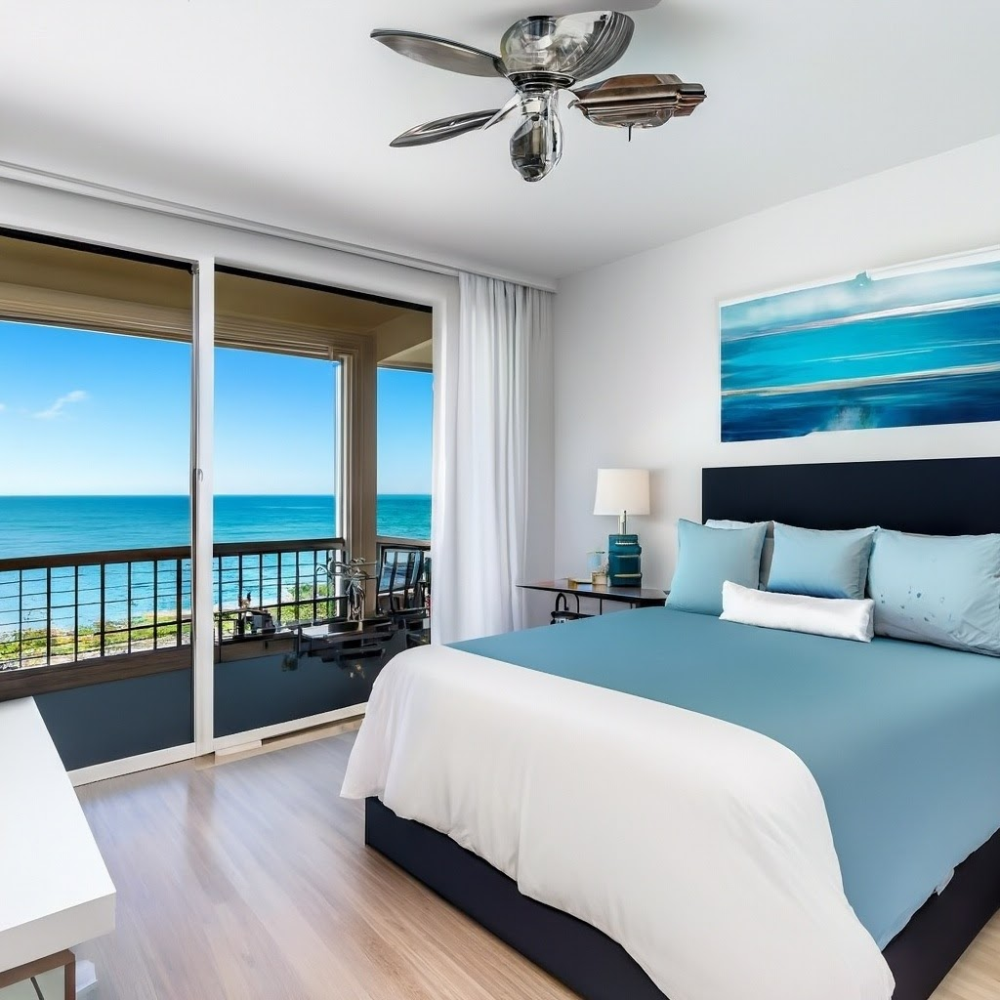

Img_exterior_url_0
https://storage.googleapis.com/vtxdemos-vsearch-airbnb/airbnbimages/1716209506808/sample_0.jpg


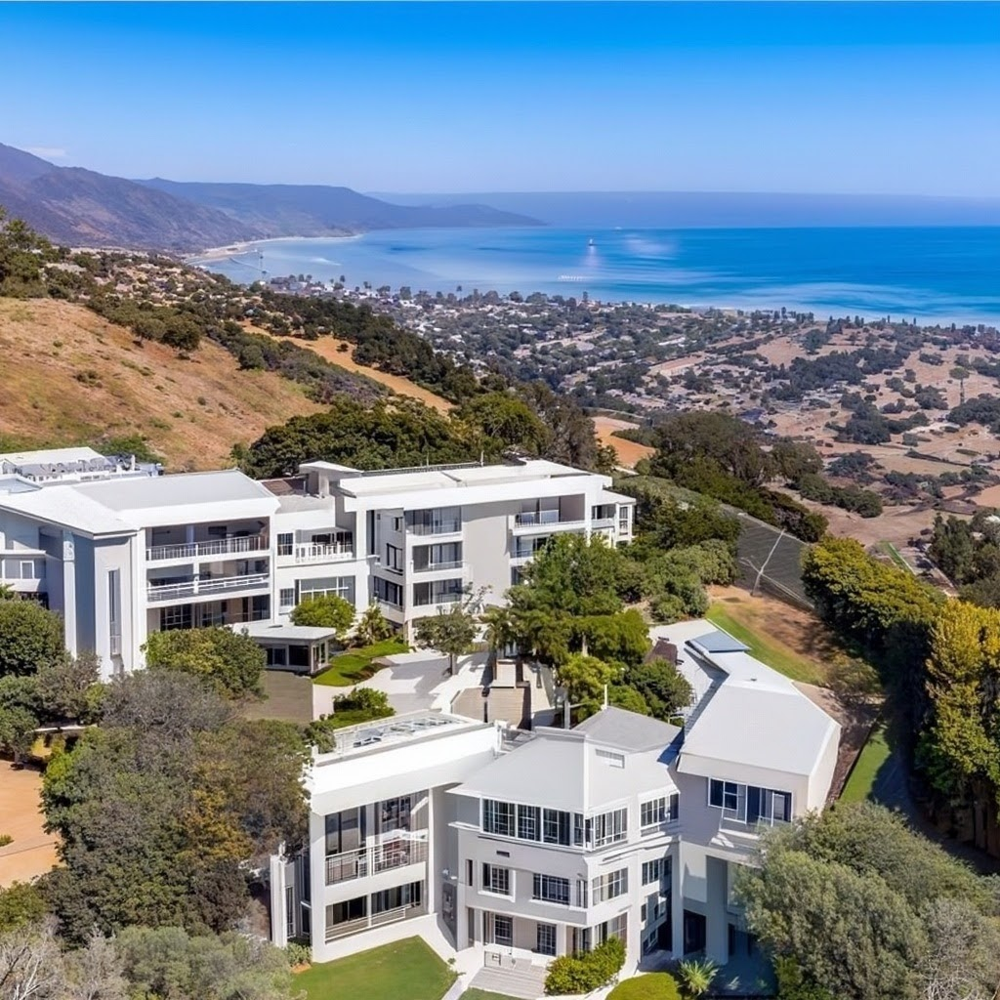

Img_interior_url_0
https://storage.googleapis.com/vtxdemos-vsearch-airbnb/airbnbimages/1716207439831/sample_0.jpg


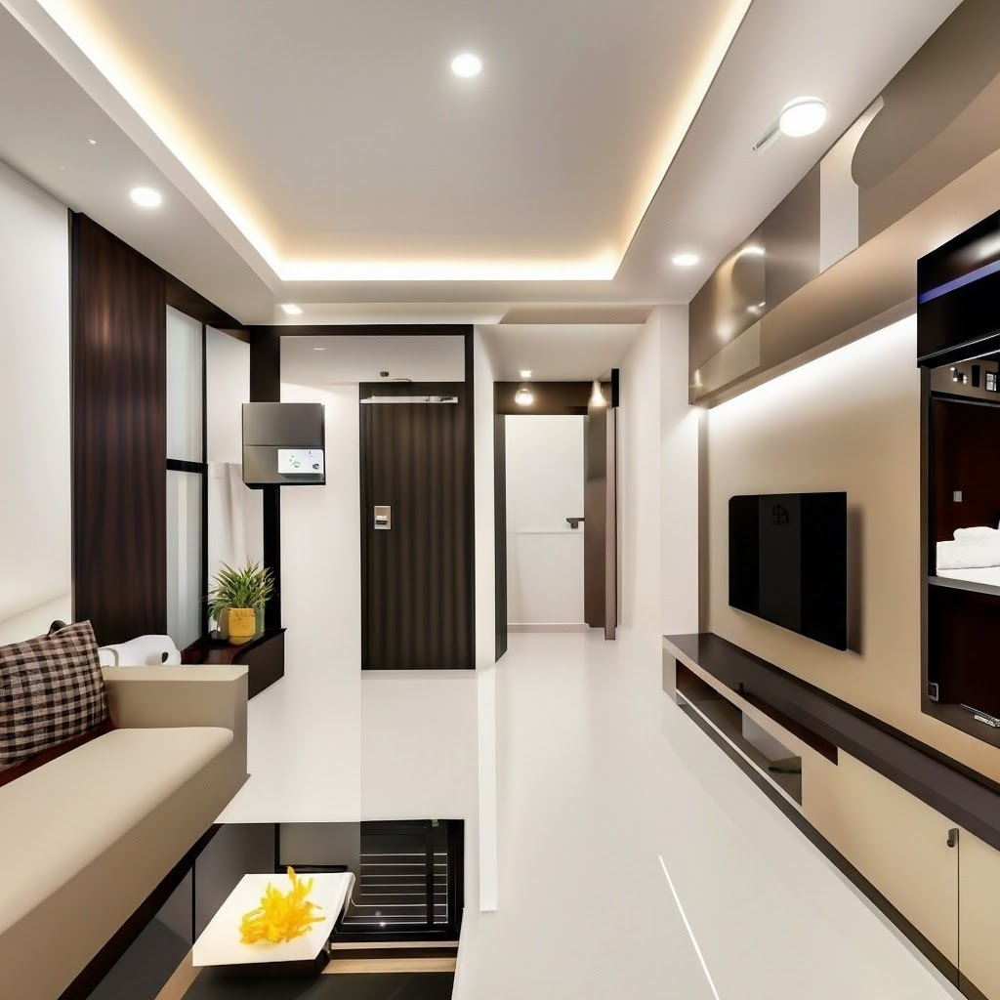

Img_exterior_url_0
https://storage.googleapis.com/vtxdemos-vsearch-airbnb/airbnbimages/1716207436112/sample_0.jpg


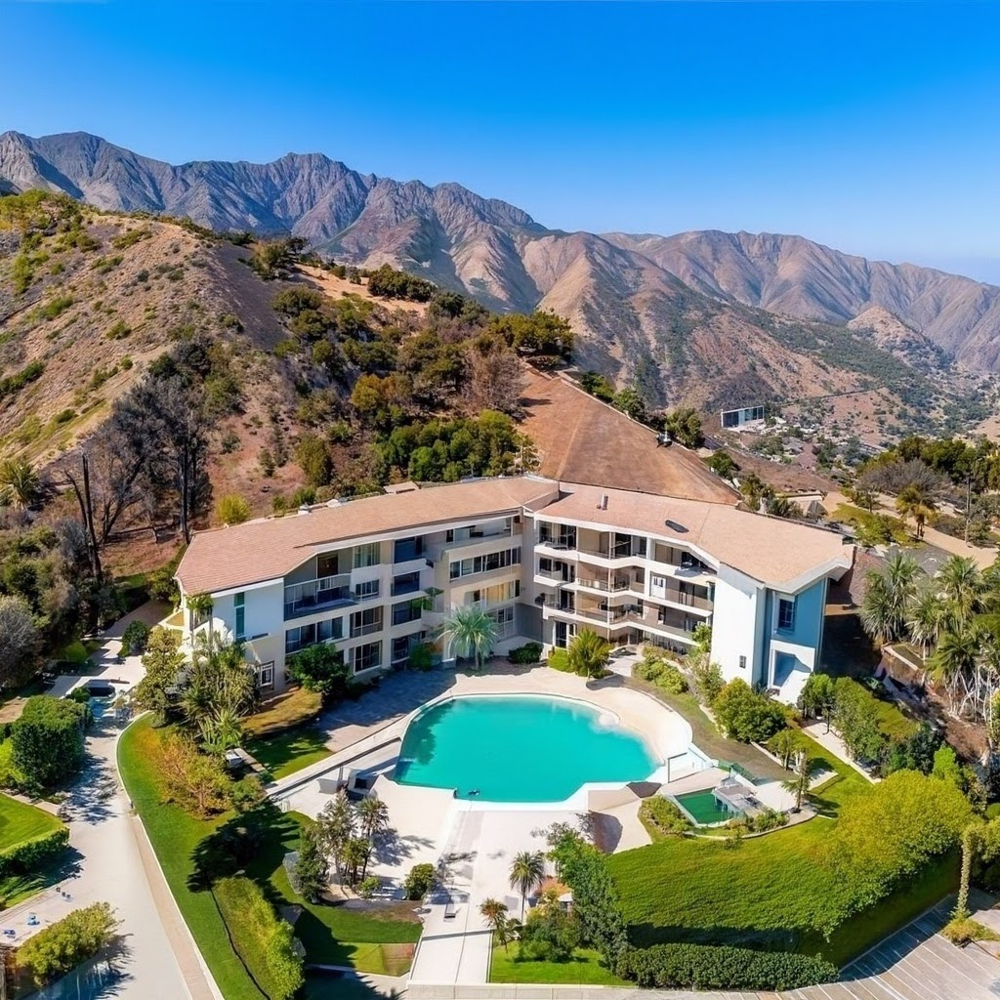

Img_interior_url_0
https://storage.googleapis.com/vtxdemos-vsearch-airbnb/airbnbimages/1716209731938/sample_0.jpg


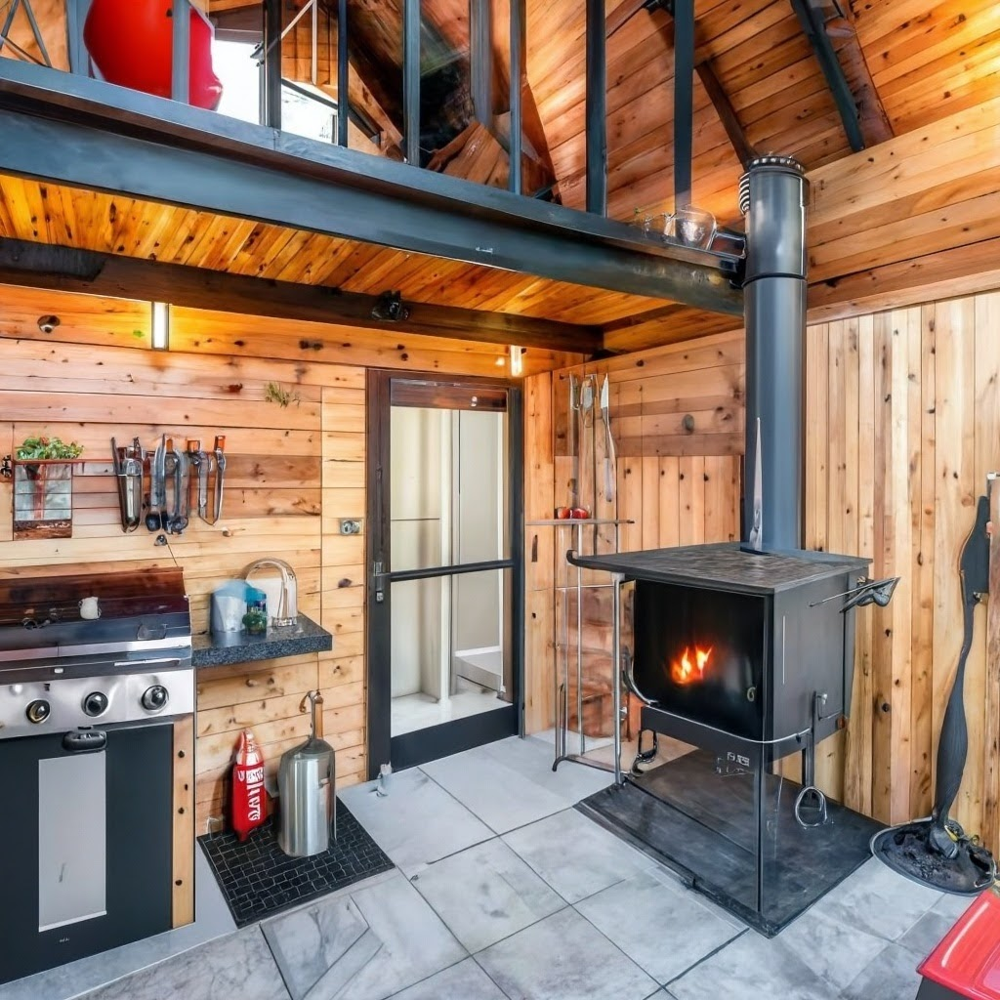

Img_exterior_url_0
https://storage.googleapis.com/vtxdemos-vsearch-airbnb/airbnbimages/1716209728165/sample_0.jpg


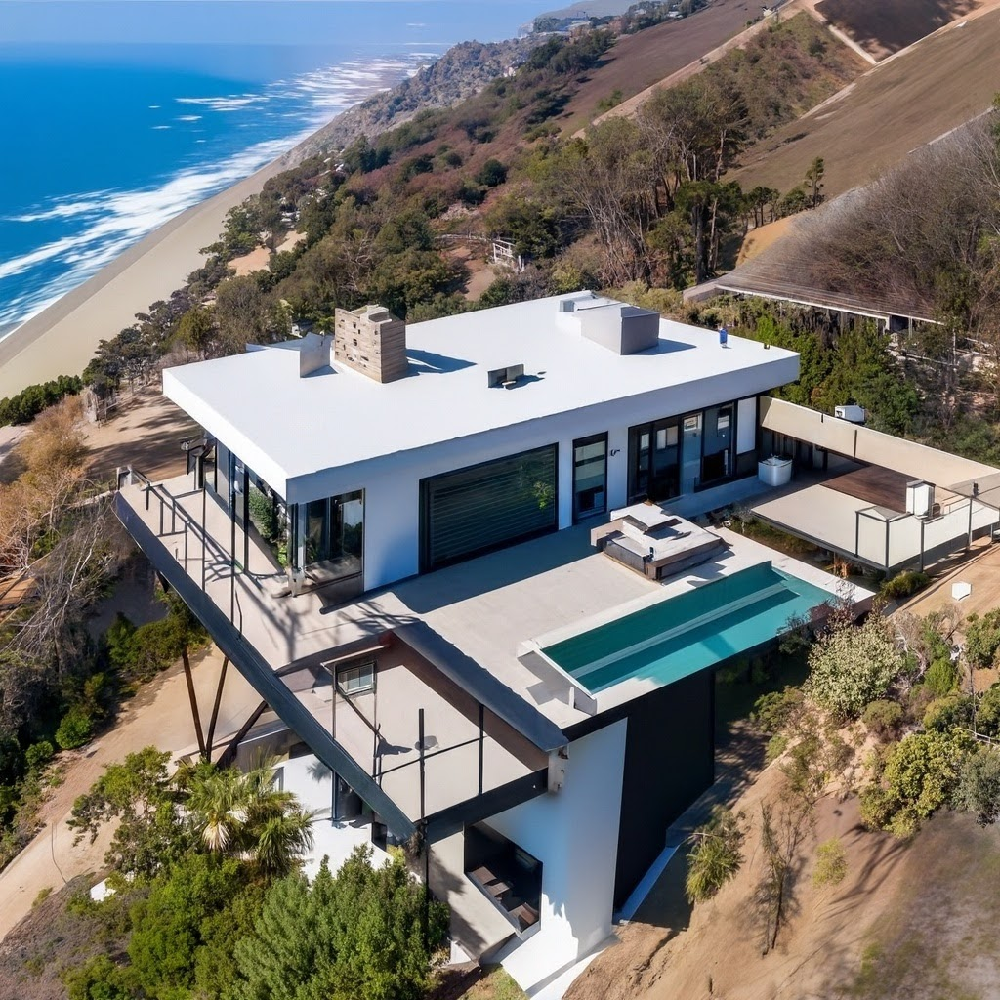

In [70]:
for index, row in final_df.iterrows():
    for im in ["Img_interior_url_", "Img_exterior_url_"]:
        for i in range(5):
            print(f"{im}{i}")
            _img = row[f"{im}{i}"]
            print(_img)
            display(Img.open(BytesIO(requests.get(_img).content)))
            break

## Vector Search (Managed Service)

In [56]:
def preprocess(df, f_name):
    df.to_pickle("text_data.pkl")
    data = df.to_json(orient='records', lines=True)
    
    with open('text_data.json', 'w') as f:
        f.write(data)
        
    storage_client.bucket("vtxdemos-vsearch-datasets").blob(f_name).upload_from_filename("text_data.json")
    return data

In [57]:
data_1 = preprocess(emb_df, "abnb_text/text_data.json")

In [60]:
abnb_index = aiplatform.MatchingEngineIndex.create_tree_ah_index(
    display_name = f"vs-abnb-index-text-1",
    contents_delta_uri = "gs://vtxdemos-vsearch-datasets/abnb_text",
    dimensions = len(emb_df["embedding"].iloc[0]),
    approximate_neighbors_count = 15,
)

Creating MatchingEngineIndex
Create MatchingEngineIndex backing LRO: projects/254356041555/locations/us-central1/indexes/6940526412847644672/operations/1663187568109289472
MatchingEngineIndex created. Resource name: projects/254356041555/locations/us-central1/indexes/6940526412847644672
To use this MatchingEngineIndex in another session:
index = aiplatform.MatchingEngineIndex('projects/254356041555/locations/us-central1/indexes/6940526412847644672')


In [61]:
abnb_index_endpoint = aiplatform.MatchingEngineIndexEndpoint.create(
    display_name = f"vs-abnb-index-endpoint-text-1",
    public_endpoint_enabled = True
)

Creating MatchingEngineIndexEndpoint
Create MatchingEngineIndexEndpoint backing LRO: projects/254356041555/locations/us-central1/indexEndpoints/8168601736236236800/operations/3969030577322983424
MatchingEngineIndexEndpoint created. Resource name: projects/254356041555/locations/us-central1/indexEndpoints/8168601736236236800
To use this MatchingEngineIndexEndpoint in another session:
index_endpoint = aiplatform.MatchingEngineIndexEndpoint('projects/254356041555/locations/us-central1/indexEndpoints/8168601736236236800')


In [62]:
abnb_index_endpoint.deploy_index(
    index = abnb_index, deployed_index_id = "vs_abnb_deployed_text_1"
)

Deploying index MatchingEngineIndexEndpoint index_endpoint: projects/254356041555/locations/us-central1/indexEndpoints/8168601736236236800
Deploy index MatchingEngineIndexEndpoint index_endpoint backing LRO: projects/254356041555/locations/us-central1/indexEndpoints/8168601736236236800/operations/3624505205829140480
MatchingEngineIndexEndpoint index_endpoint Deployed index. Resource name: projects/254356041555/locations/us-central1/indexEndpoints/8168601736236236800


resource name: projects/254356041555/locations/us-central1/indexEndpoints/8168601736236236800